In [1]:
import re
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
%matplotlib inline
import warnings 
warnings.filterwarnings('ignore')
import seaborn as sns
# pip install plotly==3.10.0
from _plotly_future_ import v4_subplots
import cufflinks
import plotly.graph_objs as go
import plotly.plotly as py
pd.options.display.max_columns = 30
from IPython.core.interactiveshell import InteractiveShell
import plotly.figure_factory as ff
InteractiveShell.ast_node_interactivity = 'all'
from plotly.offline import iplot
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

from textblob import TextBlob

In [2]:
df = pd.read_csv("covidsentimentdata.csv")
df.head()

,date,tweet,replies_count,retweets_count,likes_count,cleaned_tweets,polarity,sentiment
0,2021-01-01,@unhealthytruth Toronto Business Journal seeks...,0,1,1,unhealthytruth toronto business journal seek i...,0.400000,Positive
1,2021-01-01,@TrumptrainA1 @hasonomans @latimes If any pers...,1,0,1,trumptraina1 hasonoman latime person go near a...,0.033333,Positive
2,2021-01-01,Happy New Year to all! Let’s quickly forget 20...,2,1,10,happy new year let quickly forget 2020 make di...,0.313939,Positive
3,2021-01-01,@ChildrensHD Toronto Business Journal seeks to...,0,0,0,childrenshd toronto business journal seek inte...,0.400000,Positive
4,2021-01-01,"Quebec changes COVID-19 vaccine strategy, won'...",0,0,0,quebec change covid19 vaccine strategy wo nt h...,0.000000,Neutral


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 289955 entries, 0 to 289954
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   date            289955 non-null  object 
 1   tweet           289955 non-null  object 
 2   replies_count   289955 non-null  int64  
 3   retweets_count  289955 non-null  int64  
 4   likes_count     289955 non-null  int64  
 5   cleaned_tweets  289955 non-null  object 
 6   polarity        289955 non-null  float64
 7   sentiment       289955 non-null  object 
dtypes: float64(1), int64(3), object(4)
memory usage: 17.7+ MB


In [4]:
df.isnull().values.any()

False

In [5]:
df['date'] = pd.to_datetime(df['date'])

In [6]:
by_day_sentiment = df.groupby([pd.Grouper(key='date', freq='D'), 'sentiment']).size().unstack('sentiment')
by_day_sentiment

sentiment,Negative,Neutral,Positive,Very Negative,Very Positive
date,,,,,
2021-01-01,317,642,543,17,23
2021-01-02,302,608,578,18,29
2021-01-03,263,760,442,48,24
2021-01-04,284,756,449,27,28
2021-01-05,266,722,506,22,31
...,...,...,...,...,...
2021-07-27,271,637,569,24,38
2021-07-28,296,564,593,24,48
2021-07-29,311,616,565,18,23


In [7]:
by_day_sentiment.iplot(xTitle='Count',
                       yTitle='Date',
                       mode="lines+markers", size=4.0,
                       gridcolor="black",
                       title='Sentiment Time Series Line Chart')

In [8]:
by_day_sentiment.iplot(xTitle='Count',
                       yTitle='Date',
                       title='Sentiment Time Series Area Chart with Subplots',
                       subplots=True,
                       width=2.0,
                       fill=True
                      )

In [9]:
by_day_sentiment.iplot(
    kind="bar",
    xTitle='Count',
    yTitle='Date',
    title='Sentiment Time Series Bar Chart',
    sortbars=True
)

In [10]:
by_day_sentiment.iplot(
    kind="bar", 
    subplots=True, 
    sortbars=True,
    xTitle='Count',
    yTitle='Date',
    title='Sentiment Time Series Bar Chart with Subplots',
    keys = ["Very Positive", "Positive", "Neutral", "Negative", "Very Negative"]
)

In [11]:
by_day_sentiment.mean().iplot(
    kind="bar",
    xTitle='Sentiment',yTitle='Avg. Count', 
    title='Average Count of Sentiment Per Day')

In [12]:
df['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

In [13]:
df0 = df.sort_values('polarity', ascending=True)
df0['sentiment'].iplot(
    kind='hist',
    xTitle='sentiment',
    linecolor='black',
    yTitle='count',
    title='Tweets Sentiment Distribution')

In [14]:
sentiment_cnt = df.groupby(by=["sentiment"]).count()[["polarity"]].rename(columns={"polarity":"Count"}).reset_index()

sentiment_cnt.iplot(kind="pie",
                    labels="sentiment",
                    values="Count",
                    textinfo='percent+label', hole=.4,
                    title='Tweets Sentiment Percentage'
                    )

In [15]:
total_count_df = df.groupby(by=["sentiment"]).sum()
total_count_df = total_count_df.drop(columns=["polarity"])
total_count_df

,replies_count,retweets_count,likes_count
sentiment,,,
Negative,68923,156184,619722
Neutral,133771,281993,1093052
Positive,170245,375414,1730770
Very Negative,3120,5122,20764
Very Positive,13560,27868,162026


In [16]:
total_count_df['replies_count'].sort_values(ascending=True).iplot(kind="bar", y="replies_count",
                  yTitle="Sentiment", xTitle="Total Replies Count", title="Total Replies Count Per Sentiment",
                  colors=["tomato"], bargap=0.5,
                  sortbars=True,
                  theme="polar",
                  orientation="h")

In [17]:
total_count_df['retweets_count'].sort_values(ascending=True).iplot(kind="bar", y="retweets_count",
                  yTitle="Sentiment", xTitle="Total Retweets Count", title="Total Retweets Count Per Sentiment",
                  colors=["tomato"], bargap=0.5,
                  sortbars=True,
                  theme="polar",
                  orientation="h")

In [18]:
total_count_df['likes_count'].sort_values(ascending=True).iplot(kind="bar", y="likes_count",
                  yTitle="Sentiment", xTitle="Total Likes Count", title="Total Likes Count Per Sentiment",
                  colors=["tomato"], bargap=0.5,
                  sortbars=True,
                  theme="polar",
                  orientation="h")

In [19]:
total_count_df.iplot(kind="bar", sortbars=True,
                   yTitle="Total React Counts", xTitle="Sentiment",
                   title="Total Tweets React Counts Per Sentiment")

In [20]:
total_count_df.iplot(kind="bar", barmode="stack",
                   yTitle="Total React Counts", xTitle="Sentiment",
                   title="Total Tweets React Counts Per Sentiment with Stacked BarChart",opacity=1.0)

In [21]:
avg_count_df = df.groupby(by=["sentiment"]).mean()
avg_count_df = avg_count_df.drop(columns=["polarity"])
avg_count_df

,replies_count,retweets_count,likes_count
sentiment,,,
Negative,1.315776,2.981635,11.830820
Neutral,1.145535,2.414820,9.360245
Positive,1.548005,3.413568,15.737563
Very Negative,0.928571,1.524405,6.179762
Very Positive,1.817694,3.735657,21.719303


In [22]:
avg_count_df['replies_count'].sort_values(ascending=True).iplot(kind="bar", y="replies_count",
                  yTitle="Sentiment", xTitle="Avg. Replies Count", title="Average Replies Count Per Sentiment",
                  colors=["tomato"], bargap=0.5,
                  sortbars=True,
                  theme="polar",
                  orientation="h")

In [23]:
avg_count_df['retweets_count'].sort_values(ascending=True).iplot(kind="bar", y="retweets_count",
                  yTitle="Sentiment", xTitle="Avg. Retweets Count", title="Average Retweets Count Per Sentiment",
                  colors=["tomato"], bargap=0.5,
                  sortbars=True,
                  theme="polar",
                  orientation="h")

In [24]:
avg_count_df['likes_count'].sort_values(ascending=True).iplot(kind="bar", y="likes_count",
                  yTitle="Sentiment", xTitle="Avg. Likes Count", title="Average Likes Count Per Sentiment",
                  colors=["tomato"], bargap=0.5,
                  sortbars=True,
                  theme="polar",
                  orientation="h")

In [25]:
avg_count_df.iplot(kind="bar", sortbars=True,
                   yTitle="Avg. React Counts", xTitle="Sentiment",
                   title="Average Tweets React Counts Per Sentiment")

In [26]:
avg_count_df.iplot(kind="bar", barmode="stack",
                   yTitle="Avg. React Counts", xTitle="Sentiment",
                   title="Average Tweets React Counts Per Sentiment with Stacked BarChart",opacity=1.0)

In [27]:
df['cleaned_tweets'] = df['cleaned_tweets'].str.replace('covid19',' ')
df['cleaned_tweets'] = df['cleaned_tweets'].str.replace('covid',' ')
df['cleaned_tweets'] = df['cleaned_tweets'].str.replace('dose',' ')
df['cleaned_tweets'] = df['cleaned_tweets'].str.replace('vaccine',' ')
df['cleaned_tweets'] = df['cleaned_tweets'].str.replace('vaccination',' ')
df['cleaned_tweets'] = df['cleaned_tweets'].str.replace('vaccinate',' ')

In [28]:
def show_wordcloud(data, title = None):
    wordcloud = WordCloud(background_color='white', max_words=50).generate(str(data))

    fig = plt.figure(1, figsize=(10, 5))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=30)
        fig.subplots_adjust(top=2.7)

    plt.imshow(wordcloud)
    plt.show()

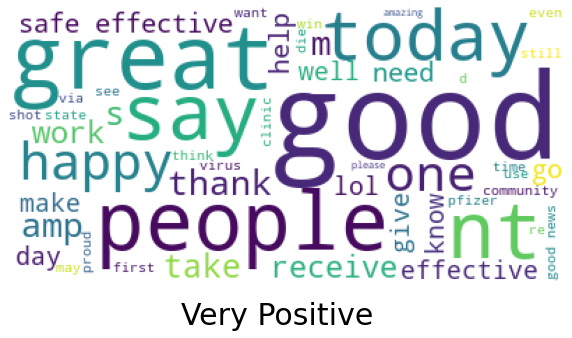

In [29]:
show_wordcloud(df.loc[df.sentiment == "Very Positive", 'cleaned_tweets'].str.cat(sep='\n'), 'Very Positive')

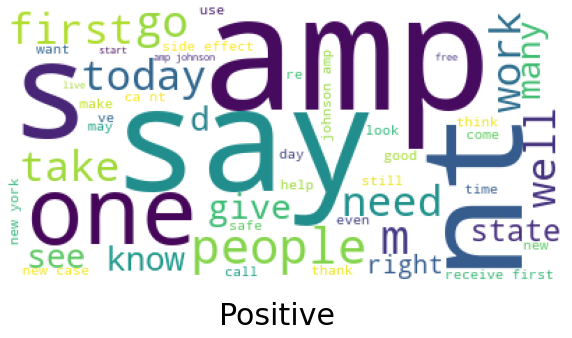

In [30]:
show_wordcloud(df.loc[df.sentiment == "Positive", 'cleaned_tweets'].str.cat(sep='\n'), 'Positive')

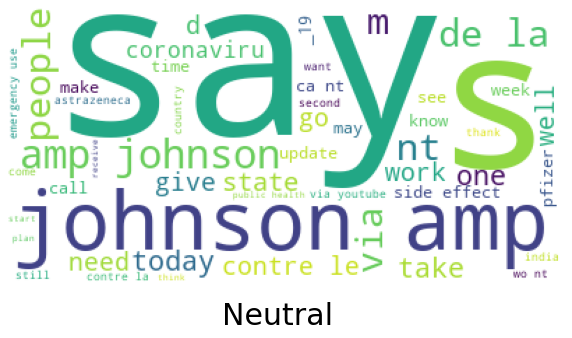

In [31]:
show_wordcloud(df.loc[df.sentiment == "Neutral", 'cleaned_tweets'].str.cat(sep='\n'), 'Neutral')

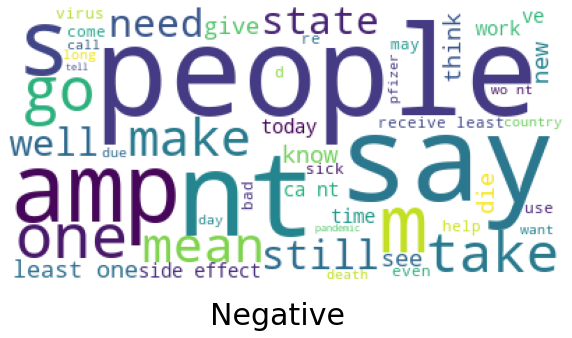

In [32]:
show_wordcloud(df.loc[df.sentiment == "Negative", 'cleaned_tweets'].str.cat(sep='\n'), 'Negative')

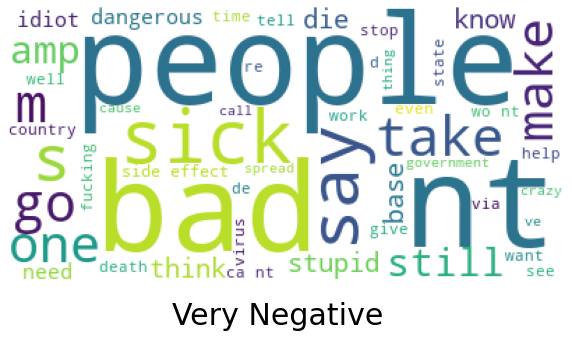

In [33]:
show_wordcloud(df.loc[df.sentiment == "Very Negative", 'cleaned_tweets'].str.cat(sep='\n'), 'Very Negative')

In [34]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_words(df['cleaned_tweets'], 20)
for word, freq in common_words:
    print(word, freq)
df1 = pd.DataFrame(common_words, columns = ['cleaned_tweets' , 'count'])
df1.groupby('cleaned_tweets').sum()['count'].sort_values(ascending=False).iplot(
kind='bar', yTitle='Count', linecolor='black', title='Top 20 Unigram words in Tweets')

get 69517
nt 34857
people 31540
say 24427
amp 22050
receive 20530
do 20010
health 19305
new 17632
first 17521
via 16480
we 16302
one 15475
take 14486
make 13385
need 12662
pfizer 12580
de 12397
death 12000
case 11815


In [35]:
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_bigram(df['cleaned_tweets'], 20)
for word, freq in common_words:
    print(word, freq)
df2 = pd.DataFrame(common_words, columns = ['cleaned_tweets' , 'count'])
df2.groupby('cleaned_tweets').sum()['count'].sort_values(ascending=False).iplot(
kind='bar', yTitle='Count', linecolor='black', title='Top 20 bigrams words in Tweets')

do nt 17645
be nt 5232
side effect 4514
johnson amp 4362
ca nt 4058
get first 3482
amp johnson 3467
wo nt 3320
you re 3187
nt get 2809
public health 2634
receive first 2377
wear mask 2368
people get 2245
have nt 2131
blood clot 2038
de la 2007
delta variant 1949
new case 1891
they re 1886


In [36]:
def get_top_n_trigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(3, 3)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_trigram(df['cleaned_tweets'], 20)
for word, freq in common_words:
    print(word, freq)
df3 = pd.DataFrame(common_words, columns = ['cleaned_tweets' , 'count'])
df3.groupby('cleaned_tweets').sum()['count'].sort_values(ascending=False).iplot(
kind='bar', yTitle='Count', linecolor='black', title='Top 20 trigrams words in Tweets')

johnson amp johnson 3437
do nt know 1290
receive least one 1216
do nt want 1211
do nt get 1089
johnson amp johnsons 885
health care worker 805
do nt need 696
emergency use authorization 659
wo nt get 608
get do nt 584
people do nt 548
ca nt get 540
la campagne de 494
get first shoot 480
county health department 480
do nt think 464
do nt work 456
food drug administration 429
get first today 425


In [37]:
blob = TextBlob(str(df['cleaned_tweets']))
print(blob.tags)
pos_df = pd.DataFrame(blob.tags, columns = ['word' , 'pos'])
pos_df = pos_df.pos.value_counts()[:20]
pos_df.iplot(
    kind='bar',
    xTitle='POS',
    yTitle='count', 
title='Top 20 Part-of-speech tagging for Tweets corpus')

[('0', 'CD'), ('unhealthytruth', 'JJ'), ('toronto', 'NN'), ('business', 'NN'), ('journal', 'NN'), ('seek', 'NN'), ('i', 'NN'), ('1', 'CD'), ('trumptraina1', 'JJ'), ('hasonoman', 'NN'), ('latime', 'NN'), ('person', 'NN'), ('go', 'VBP'), ('near', 'IN'), ('a', 'DT'), ('2', 'CD'), ('happy', 'JJ'), ('new', 'JJ'), ('year', 'NN'), ('let', 'RBR'), ('quickly', 'RB'), ('forget', 'VB'), ('2020', 'CD'), ('make', 'NN'), ('di', 'NN'), ('3', 'CD'), ('childrenshd', 'NN'), ('toronto', 'NN'), ('business', 'NN'), ('journal', 'NN'), ('seek', 'NN'), ('inte', 'NN'), ('4', 'CD'), ('quebec', 'NN'), ('change', 'NN'), ('strategy', 'NN'), ('wo', 'MD'), ('nt', 'VB'), ('hold', 'VB'), ('back', 'RP'), ('b', 'NN'), ('289950', 'CD'), ('pdoocy', 'JJ'), ('wh', 'JJ'), ('report', 'NN'), ('1', 'CD'), ('hospitalisation', 'NN'), ('people', 'NNS'), ('289951', 'CD'), ('please', 'NN'), ('wear', 'JJ'), ('mask', 'NN'), ('be', 'VB'), ('nt', 'JJ'), ('cure', 'NN'), ('prophylactic', 'JJ'), ('b', 'NN'), ('289952', 'CD'), ('nmalliotaki

# Here’s a list of the tags, what they mean, and some examples:
<b>CC</b> coordinating conjunction <br>
<b>CD</b> cardinal digit <br>
<b>DT</b> determiner <br>
<b>EX</b> existential there (like: “there is” … think of it like “there exists”) <br>
<b>FW</b> foreign word <br>
<b>IN</b> preposition/subordinating conjunction <br>
<b>JJ</b> adjective ‘big’ <br>
<b>JJR</b> adjective, comparative ‘bigger’ <br>
<b>JJS</b> adjective, superlative ‘biggest’ <br>
<b>LS</b> list marker 1) <br>
<b>MD</b> modal could, will <br>
<b>NN</b> noun, singular ‘desk’ <br>
<b>NNS</b> noun plural ‘desks’ <br>
<b>NNP</b> proper noun, singular ‘Harrison’ <br>
<b>NNPS</b> proper noun, plural ‘Americans’ <br>
<b>PDT</b> predeterminer ‘all the kids’ <br> 
<b>POS</b> possessive ending parent‘s <br>
<b>PRP</b> personal pronoun I, he, she <br>
<b>PRP\\$</b> possessive pronoun my, his, hers <br>
<b>RB</b> adverb very, silently, <br>
<b>RBR</b> adverb, comparative better <br>
<b>RBS</b> adverb, superlative best <br>
<b>RP</b> particle give up <br>
<b>TO</b> to go ‘to‘ the store. <br>
<b>UH</b> interjection errrrrrrrm <br>
<b>VB</b> verb, base form take <br>
<b>VBD</b> verb, past tense took <br>
<b>VBG</b> verb, gerund/present participle taking <br>
<b>VBN</b> verb, past participle taken <br>
<b>VBP</b> verb, sing. present, non-3d take <br>
<b>VBZ</b> verb, 3rd person sing. present takes <br>
<b>WDT</b> wh-determiner which <br>
<b>WP</b> wh-pronoun who, what <br>
<b>WP\\$</b> possessive wh-pronoun whose <br>
<b>WRB</b> wh-abverb where, when <br>